# Fine‑tune SoteMix VAE on Colab
This notebook installs dependencies, loads the public SoteMix VAE from Hugging Face, and runs training with TensorBoard logging.

In [1]:
!pip install torch torchvision diffusers accelerate transformers huggingface_hub safetensors tensorboard drive hf_xet sympy==1.12.1

In [2]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1. Generate Images for VAE Training
Generates 1,000 images using the default VAE and saves them to Drive.

In [ ]:
import os
import torch
from torch import autocast
from diffusers import StableDiffusionPipeline
from tqdm import trange

# Paths
GEN_DIR = "/content/drive/MyDrive/vae_dataset/generated_images"
os.makedirs(GEN_DIR, exist_ok=True)

# Load pipeline with default VAE
pipe = StableDiffusionPipeline.from_pretrained(
    "Disty0/SoteMix",
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

# Generation parameters
num_images = 1000
prompt = "1girl"
batch_size = 4
guidance_scale = 7.5
num_inference_steps = 50

for i in trange(0, num_images, batch_size):
    batch_prompts = [prompt] * min(batch_size, num_images - i)
    with autocast("cuda"):
        images = pipe(batch_prompts, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps).images
    for j, img in enumerate(images):
        idx = i + j
        img.save(os.path.join(GEN_DIR, f"{idx:04d}.png"))

model_index.json:   0%|          | 0.00/597 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/392 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/585 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/704 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.78k [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/601 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/transformers/models/clip/feature_extraction_clip.py:30: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
  0%|          | 0/250 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 1/250 [00:28<1:58:46, 28.62s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  1%|          | 2/250 [00:56<1:56:11, 28.11s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  1%|          | 3/250 [01:24<1:56:31, 28.31s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  2%|▏         | 4/250 [01:54<1:57:57, 28.77s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  2%|▏         | 5/250 [02:24<2:00:01, 29.39s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  2%|▏         | 6/250 [02:56<2:01:55, 29.98s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  3%|▎         | 7/250 [03:26<2:02:35, 30.27s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  3%|▎         | 8/250 [03:57<2:02:45, 30.44s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▎         | 9/250 [04:28<2:02:50, 30.58s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▍         | 10/250 [04:59<2:02:49, 30.71s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  4%|▍         | 11/250 [05:30<2:02:25, 30.73s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  5%|▍         | 12/250 [06:01<2:01:59, 30.75s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  5%|▌         | 13/250 [06:32<2:01:47, 30.83s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 14/250 [07:03<2:01:25, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▌         | 15/250 [07:34<2:00:57, 30.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  6%|▋         | 16/250 [08:04<2:00:27, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  7%|▋         | 17/250 [08:35<1:59:54, 30.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  7%|▋         | 18/250 [09:06<1:59:21, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  8%|▊         | 19/250 [09:37<1:58:45, 30.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  8%|▊         | 20/250 [10:08<1:58:14, 30.84s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  8%|▊         | 21/250 [10:39<1:57:44, 30.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  9%|▉         | 22/250 [11:10<1:57:20, 30.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  9%|▉         | 23/250 [11:41<1:57:08, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 10%|▉         | 24/250 [12:12<1:56:36, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 10%|█         | 25/250 [12:43<1:56:04, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 10%|█         | 26/250 [13:14<1:55:38, 30.97s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 11%|█         | 27/250 [13:45<1:55:07, 30.98s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 11%|█         | 28/250 [14:16<1:54:33, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 12%|█▏        | 29/250 [14:47<1:54:06, 30.98s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 12%|█▏        | 30/250 [15:17<1:53:30, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 12%|█▏        | 31/250 [15:48<1:52:56, 30.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 13%|█▎        | 32/250 [16:19<1:52:36, 30.99s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 13%|█▎        | 33/250 [16:50<1:52:04, 30.99s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 14%|█▎        | 34/250 [17:21<1:51:33, 30.99s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 14%|█▍        | 35/250 [17:53<1:51:06, 31.01s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 14%|█▍        | 36/250 [18:23<1:50:33, 31.00s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 15%|█▍        | 37/250 [18:54<1:50:01, 30.99s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 15%|█▌        | 38/250 [19:26<1:49:40, 31.04s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 16%|█▌        | 39/250 [19:57<1:49:00, 31.00s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 16%|█▌        | 40/250 [20:27<1:48:18, 30.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 16%|█▋        | 41/250 [20:58<1:47:50, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 17%|█▋        | 42/250 [21:29<1:47:23, 30.98s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 17%|█▋        | 43/250 [22:00<1:46:48, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 18%|█▊        | 44/250 [22:31<1:46:18, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 18%|█▊        | 45/250 [23:02<1:45:48, 30.97s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 18%|█▊        | 46/250 [23:33<1:45:14, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 19%|█▉        | 47/250 [24:04<1:44:43, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 19%|█▉        | 48/250 [24:35<1:44:13, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 20%|█▉        | 49/250 [25:06<1:43:48, 30.99s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 20%|██        | 50/250 [25:37<1:43:15, 30.98s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 20%|██        | 51/250 [26:08<1:42:44, 30.98s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 21%|██        | 52/250 [26:39<1:42:17, 31.00s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 21%|██        | 53/250 [27:10<1:41:40, 30.97s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 22%|██▏       | 54/250 [27:41<1:41:03, 30.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 22%|██▏       | 55/250 [28:12<1:40:40, 30.98s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 22%|██▏       | 56/250 [28:43<1:40:07, 30.97s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 23%|██▎       | 57/250 [29:14<1:39:32, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 23%|██▎       | 58/250 [29:45<1:39:09, 30.99s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 24%|██▎       | 59/250 [30:16<1:38:32, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 24%|██▍       | 60/250 [30:47<1:37:53, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 24%|██▍       | 61/250 [31:17<1:37:22, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 25%|██▍       | 62/250 [31:48<1:36:47, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 25%|██▌       | 63/250 [32:19<1:36:15, 30.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 26%|██▌       | 64/250 [32:50<1:35:52, 30.93s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 26%|██▌       | 65/250 [33:21<1:35:20, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 26%|██▋       | 66/250 [33:52<1:34:49, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 27%|██▋       | 67/250 [34:23<1:34:17, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 27%|██▋       | 68/250 [34:54<1:33:48, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 28%|██▊       | 69/250 [35:25<1:33:23, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 28%|██▊       | 70/250 [35:56<1:32:51, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 28%|██▊       | 71/250 [36:27<1:32:13, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 29%|██▉       | 72/250 [36:58<1:31:44, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 29%|██▉       | 73/250 [37:29<1:31:12, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 30%|██▉       | 74/250 [37:59<1:30:41, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 30%|███       | 75/250 [38:31<1:30:19, 30.97s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 30%|███       | 76/250 [39:01<1:29:45, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 31%|███       | 77/250 [39:32<1:29:14, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 31%|███       | 78/250 [40:03<1:28:48, 30.98s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 32%|███▏      | 79/250 [40:34<1:28:14, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 32%|███▏      | 80/250 [41:05<1:27:40, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 32%|███▏      | 81/250 [41:36<1:27:13, 30.97s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 33%|███▎      | 82/250 [42:07<1:26:41, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 33%|███▎      | 83/250 [42:38<1:26:08, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 34%|███▎      | 84/250 [43:09<1:25:29, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 34%|███▍      | 85/250 [43:40<1:24:53, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 34%|███▍      | 86/250 [44:11<1:24:18, 30.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 35%|███▍      | 87/250 [44:41<1:23:51, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 35%|███▌      | 88/250 [45:12<1:23:24, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 36%|███▌      | 89/250 [45:43<1:22:56, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 36%|███▌      | 90/250 [46:14<1:22:19, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 36%|███▋      | 91/250 [46:45<1:21:44, 30.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 37%|███▋      | 92/250 [47:16<1:21:09, 30.82s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 37%|███▋      | 93/250 [47:46<1:20:35, 30.80s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 38%|███▊      | 94/250 [48:17<1:20:04, 30.80s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 38%|███▊      | 95/250 [48:48<1:19:34, 30.80s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 38%|███▊      | 96/250 [49:19<1:19:02, 30.80s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 39%|███▉      | 97/250 [49:50<1:18:33, 30.80s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 39%|███▉      | 98/250 [50:20<1:18:03, 30.81s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 40%|███▉      | 99/250 [50:51<1:17:35, 30.83s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 40%|████      | 100/250 [51:22<1:17:09, 30.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 40%|████      | 101/250 [51:53<1:16:39, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 41%|████      | 102/250 [52:24<1:16:10, 30.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 41%|████      | 103/250 [52:55<1:15:41, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 42%|████▏     | 104/250 [53:26<1:15:14, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 42%|████▏     | 105/250 [53:57<1:14:46, 30.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 42%|████▏     | 106/250 [54:28<1:14:13, 30.93s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 43%|████▎     | 107/250 [54:59<1:13:46, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 43%|████▎     | 108/250 [55:30<1:13:14, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 44%|████▎     | 109/250 [56:01<1:12:43, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 44%|████▍     | 110/250 [56:32<1:12:16, 30.98s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 44%|████▍     | 111/250 [57:03<1:11:40, 30.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 45%|████▍     | 112/250 [57:33<1:11:04, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 45%|████▌     | 113/250 [58:04<1:10:35, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 46%|████▌     | 114/250 [58:35<1:10:03, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 46%|████▌     | 115/250 [59:06<1:09:33, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 46%|████▋     | 116/250 [59:37<1:09:05, 30.93s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 47%|████▋     | 117/250 [1:00:08<1:08:31, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 47%|████▋     | 118/250 [1:00:39<1:07:57, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 48%|████▊     | 119/250 [1:01:10<1:07:30, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 48%|████▊     | 120/250 [1:01:41<1:07:02, 30.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 48%|████▊     | 121/250 [1:02:12<1:06:29, 30.93s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 49%|████▉     | 122/250 [1:02:43<1:05:56, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 49%|████▉     | 123/250 [1:03:14<1:05:22, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 50%|████▉     | 124/250 [1:03:44<1:04:51, 30.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 50%|█████     | 125/250 [1:04:15<1:04:23, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 50%|█████     | 126/250 [1:04:46<1:03:49, 30.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 51%|█████     | 127/250 [1:05:17<1:03:14, 30.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 51%|█████     | 128/250 [1:05:48<1:02:44, 30.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 52%|█████▏    | 129/250 [1:06:19<1:02:14, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 52%|█████▏    | 130/250 [1:06:50<1:01:47, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 52%|█████▏    | 131/250 [1:07:21<1:01:17, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 53%|█████▎    | 132/250 [1:07:51<1:00:45, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 53%|█████▎    | 133/250 [1:08:22<1:00:15, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 54%|█████▎    | 134/250 [1:08:53<59:42, 30.88s/it]  

  0%|          | 0/50 [00:00<?, ?it/s]

 54%|█████▍    | 135/250 [1:09:24<59:08, 30.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 54%|█████▍    | 136/250 [1:09:55<58:42, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 55%|█████▍    | 137/250 [1:10:26<58:12, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 55%|█████▌    | 138/250 [1:10:57<57:41, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 56%|█████▌    | 139/250 [1:11:28<57:09, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 56%|█████▌    | 140/250 [1:11:59<56:35, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 56%|█████▋    | 141/250 [1:12:29<56:03, 30.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 57%|█████▋    | 142/250 [1:13:00<55:30, 30.84s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 57%|█████▋    | 143/250 [1:13:31<55:01, 30.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 58%|█████▊    | 144/250 [1:14:02<54:36, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 58%|█████▊    | 145/250 [1:14:33<54:06, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 58%|█████▊    | 146/250 [1:15:04<53:32, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 59%|█████▉    | 147/250 [1:15:35<53:03, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 59%|█████▉    | 148/250 [1:16:06<52:29, 30.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 60%|█████▉    | 149/250 [1:16:36<51:57, 30.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 60%|██████    | 150/250 [1:17:07<51:27, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 60%|██████    | 151/250 [1:17:38<50:59, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 61%|██████    | 152/250 [1:18:09<50:32, 30.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 61%|██████    | 153/250 [1:18:40<49:59, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 62%|██████▏   | 154/250 [1:19:11<49:27, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 62%|██████▏   | 155/250 [1:19:42<49:00, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 62%|██████▏   | 156/250 [1:20:13<48:28, 30.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 63%|██████▎   | 157/250 [1:20:44<47:53, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 63%|██████▎   | 158/250 [1:21:15<47:19, 30.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 64%|██████▎   | 159/250 [1:21:45<46:46, 30.84s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 64%|██████▍   | 160/250 [1:22:16<46:20, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 64%|██████▍   | 161/250 [1:22:47<45:50, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 65%|██████▍   | 162/250 [1:23:18<45:19, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 65%|██████▌   | 163/250 [1:23:49<44:47, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 66%|██████▌   | 164/250 [1:24:20<44:16, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 66%|██████▌   | 165/250 [1:24:51<43:47, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 66%|██████▋   | 166/250 [1:25:22<43:17, 30.93s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 67%|██████▋   | 167/250 [1:25:53<42:47, 30.93s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 67%|██████▋   | 168/250 [1:26:24<42:18, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 68%|██████▊   | 169/250 [1:26:55<41:46, 30.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 68%|██████▊   | 170/250 [1:27:26<41:15, 30.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 68%|██████▊   | 171/250 [1:27:57<40:47, 30.98s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 69%|██████▉   | 172/250 [1:28:28<40:12, 30.93s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 69%|██████▉   | 173/250 [1:28:59<39:40, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 70%|██████▉   | 174/250 [1:29:29<39:09, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 70%|███████   | 175/250 [1:30:00<38:38, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 70%|███████   | 176/250 [1:30:31<38:10, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 71%|███████   | 177/250 [1:31:02<37:37, 30.93s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 71%|███████   | 178/250 [1:31:33<37:03, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 72%|███████▏  | 179/250 [1:32:04<36:30, 30.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 72%|███████▏  | 180/250 [1:32:35<35:57, 30.82s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 72%|███████▏  | 181/250 [1:33:05<35:28, 30.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 73%|███████▎  | 182/250 [1:33:36<34:58, 30.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 73%|███████▎  | 183/250 [1:34:07<34:28, 30.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 74%|███████▎  | 184/250 [1:34:38<34:01, 30.93s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 74%|███████▍  | 185/250 [1:35:09<33:29, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 74%|███████▍  | 186/250 [1:35:40<32:57, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 75%|███████▍  | 187/250 [1:36:11<32:26, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 75%|███████▌  | 188/250 [1:36:42<31:55, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 76%|███████▌  | 189/250 [1:37:13<31:26, 30.93s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 76%|███████▌  | 190/250 [1:37:44<30:55, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 76%|███████▋  | 191/250 [1:38:15<30:23, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 77%|███████▋  | 192/250 [1:38:46<29:52, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 77%|███████▋  | 193/250 [1:39:17<29:22, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 78%|███████▊  | 194/250 [1:39:48<28:53, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 78%|███████▊  | 195/250 [1:40:18<28:21, 30.93s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 78%|███████▊  | 196/250 [1:40:49<27:48, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 79%|███████▉  | 197/250 [1:41:20<27:20, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 79%|███████▉  | 198/250 [1:41:51<26:50, 30.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 80%|███████▉  | 199/250 [1:42:22<26:18, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 80%|████████  | 200/250 [1:42:53<25:45, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 80%|████████  | 201/250 [1:43:24<25:12, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 81%|████████  | 202/250 [1:43:55<24:42, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 81%|████████  | 203/250 [1:44:26<24:11, 30.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 82%|████████▏ | 204/250 [1:44:56<23:40, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 82%|████████▏ | 205/250 [1:45:27<23:11, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 82%|████████▏ | 206/250 [1:45:58<22:40, 30.93s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 83%|████████▎ | 207/250 [1:46:29<22:09, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 83%|████████▎ | 208/250 [1:47:00<21:40, 30.97s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 84%|████████▎ | 209/250 [1:47:31<21:09, 30.97s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 84%|████████▍ | 210/250 [1:48:02<20:37, 30.95s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 84%|████████▍ | 211/250 [1:48:33<20:07, 30.97s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 85%|████████▍ | 212/250 [1:49:04<19:35, 30.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 85%|████████▌ | 213/250 [1:49:35<19:03, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 86%|████████▌ | 214/250 [1:50:06<18:31, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 86%|████████▌ | 215/250 [1:50:37<17:59, 30.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 86%|████████▋ | 216/250 [1:51:07<17:29, 30.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 87%|████████▋ | 217/250 [1:51:38<16:57, 30.84s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 87%|████████▋ | 218/250 [1:52:09<16:25, 30.80s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 88%|████████▊ | 219/250 [1:52:40<15:55, 30.82s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 88%|████████▊ | 220/250 [1:53:11<15:24, 30.82s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 88%|████████▊ | 221/250 [1:53:42<14:54, 30.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 89%|████████▉ | 222/250 [1:54:13<14:25, 30.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 89%|████████▉ | 223/250 [1:54:43<13:53, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 90%|████████▉ | 224/250 [1:55:14<13:22, 30.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 90%|█████████ | 225/250 [1:55:45<12:50, 30.82s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 90%|█████████ | 226/250 [1:56:16<12:19, 30.80s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/diffusers/image_processor.py:147: RuntimeWarning: invalid value encountered in cast
  images = (images * 255).round().astype("uint8")
 91%|█████████ | 227/250 [1:56:46<11:47, 30.78s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 91%|█████████ | 228/250 [1:57:17<11:17, 30.78s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 92%|█████████▏| 229/250 [1:57:48<10:46, 30.77s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 92%|█████████▏| 230/250 [1:58:19<10:16, 30.81s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 92%|█████████▏| 231/250 [1:58:50<09:45, 30.81s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 93%|█████████▎| 232/250 [1:59:21<09:15, 30.84s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 93%|█████████▎| 233/250 [1:59:52<08:45, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 94%|█████████▎| 234/250 [2:00:23<08:14, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 94%|█████████▍| 235/250 [2:00:53<07:43, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 94%|█████████▍| 236/250 [2:01:24<07:12, 30.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 95%|█████████▍| 237/250 [2:01:55<06:41, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 95%|█████████▌| 238/250 [2:02:26<06:10, 30.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 96%|█████████▌| 239/250 [2:02:57<05:39, 30.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 96%|█████████▌| 240/250 [2:03:28<05:08, 30.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 96%|█████████▋| 241/250 [2:03:59<04:38, 30.92s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 97%|█████████▋| 242/250 [2:04:30<04:07, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 97%|█████████▋| 243/250 [2:05:01<03:36, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 98%|█████████▊| 244/250 [2:05:32<03:05, 30.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 98%|█████████▊| 245/250 [2:06:02<02:34, 30.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 98%|█████████▊| 246/250 [2:06:33<02:03, 30.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 99%|█████████▉| 247/250 [2:07:04<01:32, 30.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 99%|█████████▉| 248/250 [2:07:35<01:01, 30.83s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

100%|█████████▉| 249/250 [2:08:06<00:30, 30.83s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 250/250 [2:08:37<00:00, 30.87s/it]


## 2. Fine‑Tune SoteMix VAE on Generated Images
Loads the generated images and fine-tunes the SoteMix VAE, logging to TensorBoard.

In [3]:
import os, random, torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from diffusers import AutoencoderKL
from torch.optim import AdamW
from torch.nn import MSELoss
from accelerate import Accelerator
from torch.utils.tensorboard import SummaryWriter
from tqdm.auto import trange, tqdm

# --- CONFIG ---
GEN_DIR    = "/content/drive/MyDrive/vae_dataset/generated_images"
MODEL_ID   = "Disty0/SoteMix"    # public HF repo
OUTPUT_DIR = "/content/drive/MyDrive/vae_dataset/vae-finetuned"
LOG_DIR    = os.path.join(OUTPUT_DIR, "runs")
BATCH_SIZE = 3
LR         = 5e-5
EPOCHS     = 6
RESOLUTION = 256
DEVICE     = "cuda"
SNAPSHOT_NAME  = "snapshots_1"

# --- split train / val ---
all_imgs = sorted([os.path.join(GEN_DIR,f) for f in os.listdir(GEN_DIR) if f.endswith(".png")])
random.seed(42)
random.shuffle(all_imgs)
split = int(0.8 * len(all_imgs))
train_paths, val_paths = all_imgs[:split], all_imgs[split:]

class ImageFolder(Dataset):
    def __init__(self, paths, resolution=512):
        self.paths = paths
        self.tf = transforms.Compose([
            transforms.Resize(resolution),
            transforms.CenterCrop(resolution),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3,[0.5]*3),
        ])
    def __len__(self): return len(self.paths)
    def __getitem__(self,i):
        img = Image.open(self.paths[i]).convert("RGB")
        return self.tf(img)

train_ds = ImageFolder(train_paths, resolution=RESOLUTION)
val_ds   = ImageFolder(val_paths,   resolution=RESOLUTION)
train_dl = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2)
val_dl   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

In [ ]:
# Prepare model, optimizer, logger
accelerator = Accelerator()
writer = SummaryWriter(log_dir=LOG_DIR, comment=SNAPSHOT_NAME)
criterion = MSELoss()

# Load the public SoteMix VAE directly from HF
vae = AutoencoderKL.from_pretrained(
    MODEL_ID,
    subfolder="vae",
).to(DEVICE)

optimizer = AdamW(vae.parameters(), lr=LR)
vae, optimizer, train_dl, val_dl = accelerator.prepare(
    vae, optimizer, train_dl, val_dl
)

# fixed batch for image‐logging
sample_batch = next(iter(train_dl)).to(DEVICE)

def unnorm(x):
    return (x * 0.5 + 0.5).clamp(0,1)

config.json:   0%|          | 0.00/601 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

In [ ]:
from tqdm.auto import trange, tqdm

global_step = 0
for epoch in trange(1, EPOCHS+1, desc="Epochs"):
    # --- TRAINING STEP ---
    vae.train()
    running_rec, running_rot = 0.0, 0.0

    for batch in tqdm(train_dl, desc="  Train batches", leave=False):
        imgs = batch.to(DEVICE)                      # [B,3,H,W]
        rot_imgs = imgs.rot90(2, dims=(2,3))         # 180 degree rotation

        # encode & decode original
        enc      = vae.encode(imgs).latent_dist.sample()
        rec_imgs = vae.decode(enc).sample
        rec_loss = criterion(rec_imgs, imgs)

        # rotate in latent space & decode
        enc_r    = enc.rot90(2, dims=(2,3))
        rot_rec  = vae.decode(enc_r).sample
        rot_loss = criterion(rot_rec, rot_imgs)

        loss = rec_loss + rot_loss
        accelerator.backward(loss)
        optimizer.step()
        optimizer.zero_grad()

        running_rec += rec_loss.item()
        running_rot += rot_loss.item()
        global_step += 1

        writer.add_scalar("Loss/train_rec_batch", rec_loss.item(), global_step)
        writer.add_scalar("Loss/train_rot_batch", rot_loss.item(), global_step)

    avg_rec = running_rec / len(train_dl)
    avg_rot = running_rot / len(train_dl)
    writer.add_scalar("Loss/train_rec_epoch",  avg_rec,  epoch)
    writer.add_scalar("Loss/train_rot_epoch",  avg_rot,  epoch)
    writer.add_scalar("Loss/train_total_epoch", avg_rec + avg_rot, epoch)

    # --- VALIDATION STEP ---
    vae.eval()
    val_rec, val_rot = 0.0, 0.0
    with torch.no_grad():
        for batch in tqdm(val_dl, desc="  Val batches", leave=False):
            imgs    = batch.to(DEVICE)
            rot_imgs= imgs.rot90(2, dims=(2,3))

            enc      = vae.encode(imgs).latent_dist.sample()
            rec_imgs = vae.decode(enc).sample
            val_rec += criterion(rec_imgs, imgs).item()

            enc_r    = enc.rot90(2, dims=(2,3))
            rot_rec  = vae.decode(enc_r).sample
            val_rot += criterion(rot_rec, rot_imgs).item()

    avg_val_rec = val_rec / len(val_dl)
    avg_val_rot = val_rot / len(val_dl)
    writer.add_scalar("Loss/val_rec_epoch",  avg_val_rec, epoch)
    writer.add_scalar("Loss/val_rot_epoch",  avg_val_rot, epoch)
    writer.add_scalar("Loss/val_total_epoch", avg_val_rec + avg_val_rot, epoch)

    # --- LOG IMAGES ---
    with torch.no_grad():
        raw   = sample_batch                                    # CPU float32
        sb    = raw.to(DEVICE)                                  # move to device
        enc   = vae.encode(sb).latent_dist.sample()
        rec_h = vae.decode(enc).sample
        rot_h = vae.decode(enc.rot90(2, dims=(2,3))).sample

        rec    = rec_h.cpu().float()
        rot_rec= rot_h.cpu().float()
        origs  = unnorm(raw)
        recons = unnorm(rec)
        rot_recons = unnorm(rot_rec)

    writer.add_images("Train/Orig",      origs,       epoch)
    writer.add_images("Train/Recon",     recons,      epoch)
    writer.add_images("Train/RotRecons", rot_recons,  epoch)

    print(
        f"Epoch {epoch}: train_rec={avg_rec:.4f}, train_rot={avg_rot:.4f}, "
        f"val_rec={avg_val_rec:.4f}, val_rot={avg_val_rot:.4f}"
    )

    # --- SAVE CHECKPOINT FOR THIS EPOCH ---
    accelerator.wait_for_everyone()
    if accelerator.is_main_process:
        # create snapshot path: OUTPUT_DIR/SNAPSHOT_NAME/epoch_{epoch}
        snap_dir = os.path.join(OUTPUT_DIR, SNAPSHOT_NAME, f"epoch_{epoch}")
        os.makedirs(snap_dir, exist_ok=True)
        vae.save_pretrained(snap_dir)

# --- SAVE MODEL ---
accelerator.wait_for_everyone()
if accelerator.is_main_process:
    vae.save_pretrained(OUTPUT_DIR, "final_model")
writer.close()

Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

  Train batches:   0%|          | 0/267 [00:00<?, ?it/s]

  Val batches:   0%|          | 0/67 [00:00<?, ?it/s]

Epoch 1: train_rec=0.0035, train_rot=0.0100, val_rec=0.0024, val_rot=0.0047


  Train batches:   0%|          | 0/267 [00:00<?, ?it/s]

  Val batches:   0%|          | 0/67 [00:00<?, ?it/s]

Epoch 2: train_rec=0.0024, train_rot=0.0042, val_rec=0.0022, val_rot=0.0037


  Train batches:   0%|          | 0/267 [00:00<?, ?it/s]

  Val batches:   0%|          | 0/67 [00:00<?, ?it/s]

Epoch 3: train_rec=0.0022, train_rot=0.0035, val_rec=0.0021, val_rot=0.0033


  Train batches:   0%|          | 0/267 [00:00<?, ?it/s]

  Val batches:   0%|          | 0/67 [00:00<?, ?it/s]

Epoch 4: train_rec=0.0021, train_rot=0.0031, val_rec=0.0020, val_rot=0.0030


  Train batches:   0%|          | 0/267 [00:00<?, ?it/s]

  Val batches:   0%|          | 0/67 [00:00<?, ?it/s]

Epoch 5: train_rec=0.0020, train_rot=0.0029, val_rec=0.0020, val_rot=0.0030


## 3. View logs via Tensorboard

Don't use firefox. Will not open Tensorboard

In [3]:
# Tensorboard on Colab cannot access Drive folder. Copy into content directory.
!cp -r /content/drive/MyDrive/vae_dataset/vae-finetuned/runs /content

In [4]:
# 1) Load the TensorBoard extension (only once per session)
%load_ext tensorboard

!ls -R /content/runs

# 2) Launch it, pointing at your run‑logs directory
%tensorboard --logdir /content/runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
/content/runs:
events.out.tfevents.1748747753.8117bfca82b3.1816.0
events.out.tfevents.1748817788.05bf1b58c18f.427.0


<IPython.core.display.Javascript object>

In [ ]:
%reload_ext tensorboard

In [ ]:
!kill 3310

## Control and Finetune Testing and Comparision

In [20]:
# Copy finetuned VAE to content directory
!mkdir /content/vae
!cp /content/drive/MyDrive/vae_dataset/vae-finetuned/diffusion_pytorch_model.safetensors /content/vae
!cp /content/drive/MyDrive/vae_dataset/vae-finetuned/config.json /content/vae

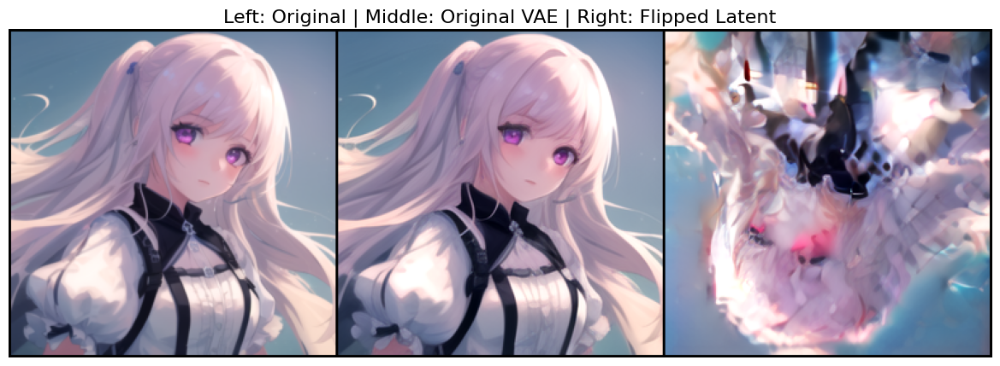

In [14]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Ensure the VAE model is loaded
# This assumes the config variables from your snippet are already in memory
vae = AutoencoderKL.from_pretrained(MODEL_ID, subfolder="vae").to(DEVICE)

# --- INFERENCE ---
# Set the model to evaluation mode
vae.eval()

# Get a random batch from the validation set for demonstration
random_idx = random.randint(0, len(val_ds) - 1)

# Select the first image from the batch and move to device
# Add a batch dimension since the model expects it
image = val_ds[random_idx].unsqueeze(0).to(DEVICE)

with torch.no_grad():
    # 1. Encode the image to get the latent distribution
    latent_dist = vae.encode(image).latent_dist
    # Get the latent vector (using the mean for a deterministic result)
    latent_vector = latent_dist.mean

    # 2. Decode the original latent vector for a standard reconstruction
    reconstructed_image = vae.decode(latent_vector).sample

    # 3. Flip the latent vector 180 degrees (flip height and width)
    # The shape is (batch, channels, height, width), so we flip dims 2 and 3
    flipped_latent = torch.flip(latent_vector, dims=(2, 3))

    # 4. Decode the flipped latent vector
    flipped_reconstruction = vae.decode(flipped_latent).sample

# --- VISUALIZATION ---

# Function to prepare images for display
def prep_for_display(tensor):
    # Denormalize from [-1, 1] to [0, 1]
    tensor = (tensor.clamp(-1, 1) + 1) / 2
    # Detach from grad, move to CPU, and convert to numpy
    return tensor.detach().cpu()

# Combine images into a single grid for easy comparison
# The grid will show: [Original, Standard Reconstruction, Flipped-Latent Reconstruction]
comparison_grid = make_grid([
    prep_for_display(image)[0],
    prep_for_display(reconstructed_image)[0],
    prep_for_display(flipped_reconstruction)[0]
], nrow=3)

# Plot the results
plt.figure(figsize=(15, 5))
plt.imshow(comparison_grid.permute(1, 2, 0))
plt.title("Left: Original | Middle: Original VAE | Right: Flipped Latent", fontsize=16)
plt.axis('off')
plt.show()

--- METRICS ---
MSE between Original and Flipped-Rotated Image: 0.0023
---------------


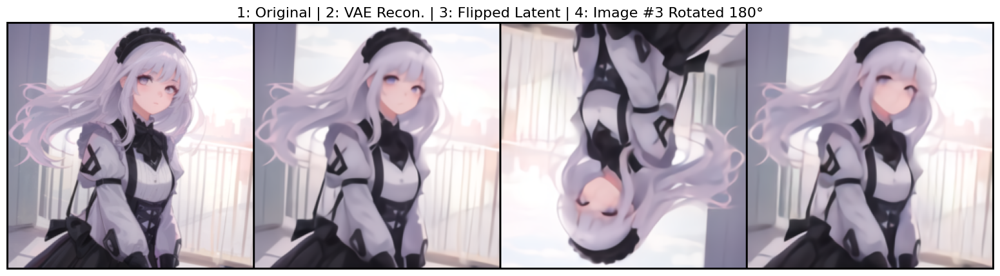

In [21]:
from torchvision.transforms import functional as F
from torch.nn.functional import mse_loss

# --- CONFIG ---
FINETUNED_VAE_DIR = "/content/vae"
DEVICE = "cuda"

vae = AutoencoderKL.from_pretrained(FINETUNED_VAE_DIR).to(DEVICE)

# --- INFERENCE ---
vae.eval()
random_idx = random.randint(0, len(val_ds) - 1)
image = val_ds[random_idx].unsqueeze(0).to(DEVICE)

with torch.no_grad():
    latent_dist = vae.encode(image).latent_dist
    latent_vector = latent_dist.sample()

    reconstructed_image = vae.decode(latent_vector).sample

    flipped_latent = torch.flip(latent_vector, dims=(2, 3))
    flipped_reconstruction = vae.decode(flipped_latent).sample

    rotated_afterwards = F.rotate(flipped_reconstruction, 180)

# --- CALCULATE THE MSE ---
# Calculate the Mean Squared Error between the original input and the final manipulated image.
# Both tensors are in the same [-1, 1] normalized range.
mse_value = mse_loss(image, rotated_afterwards)

print("--- METRICS ---")
print(f"MSE between Original and Flipped-Rotated Image: {mse_value.item():.4f}")
print("---------------")


# --- VISUALIZE THE RESULTS ---
def prep_for_display(tensor):
    tensor = (tensor.clamp(-1, 1) + 1) / 2
    return tensor.detach().cpu()

comparison_grid = make_grid([
    prep_for_display(image)[0],
    prep_for_display(reconstructed_image)[0],
    prep_for_display(flipped_reconstruction)[0],
    prep_for_display(rotated_afterwards)[0]
], nrow=4)

plt.figure(figsize=(20, 5))
plt.imshow(comparison_grid.permute(1, 2, 0))
plt.title("1: Original | 2: VAE Recon. | 3: Flipped Latent | 4: Image #3 Rotated 180°", fontsize=16)
plt.axis('off')
plt.show()